# Library

In [1]:
import pandas as pd
import numpy as np
from bertopic import BERTopic
import sys
sys.path.append('../../../Util')
import ShowGraphs as sg
from bertopic._utils import MyLogger
logger = MyLogger(level="ERROR")

# 7 Baseline Summary Content

### Clustering Approach

- **Parameter Setting**:
  - Embedding Model: all-MiniLM-L6-v2
  - Representation Model: keyBERTInspired, MaximalMarginalRelevance
  - Count Vectorizer
  - CtfIDF
  - UMAP: 150 neighbors, 10 components
  - HDBSCAN: 500 min cluster size
  - Zero-Shot Classification on cluster name
  - Outliers-reduction with Probabilites: 0.092 threshold

### Clustering Results

- **Clusters Retrieved**: 26 in which the most important ones concern:
  1. Social Media Hacking
  2. Spotify account
  3. Only Fans
  4. Discord accounts
  5. Netflix accounts
  6. Data leak

- **Performance Metrics**:
  - **Silhouette Score**: 0.62
  - **Davies-Bouldin Score**: 0.48
  - **Coherence-Score**: 0.51
  - **Dos Score**: 0.2
  - **%Outliers**: 0.38 (36k/94k)

# Code

In order to avoid importing the whole **BERTopicUtils.py** module, and thus the linked libraries, I have only brought back the function needed to make predictions, it is the same as in the module

In [18]:
def predict_topic(topic_model: BERTopic, sentence: list, num_classes: int = 5, custom_labels: bool = False) -> pd.DataFrame:
    """
    Predict the topic of a sentence using the BERTopic model.
    :param topic_model: The BERTopic model.
    :param sentence: The sentence to predict the topic of.
    :param num_classes: The number of classes to return.
    :param custom_labels: Whether to use custom labels.
    :return: A DataFrame with the predicted topics.
    """
    # Transform the sentence
    _, pr = topic_model.transform(sentence)

    # Get the top indices
    top_indices = np.argsort(pr[0])[::-1][:num_classes]

    # Get the top topics
    if custom_labels:
        top_topics = [(topic_model.get_topic(i), pr[0][i], topic_model.custom_labels_[i+1]) for i in top_indices]
    else:
        top_topics = [(topic_model.get_topic(i), pr[0][i], topic_model.generate_topic_labels()[i+1]) for i in top_indices]
    
    # Create a DataFrame with the results
    df_finals = pd.DataFrame(top_topics, columns=['Topic', 'Probability', 'Label'])

    # Extract the words and sentence
    df_finals['Words'] = df_finals['Topic'].apply(lambda topic: [word for word, _ in topic])

    df_finals['Sentence'] = sentence * len(df_finals)
    
    return df_finals

# Visualize CSV Files

In [3]:
topic_model = BERTopic.load("../../../Analyze_files/CombiningAnalysisCompleteDataset/ThreadAnalysis/Models/topic_model_all-MiniLM-L6-v2_500_150n_10dim_raid")

In [2]:
descr_topic = pd.read_csv('CSV26TopicRaid/description_topic.csv')
document_topic = pd.read_csv('CSV26TopicRaid/document_topic_proba.csv')
topics_over_time = pd.read_csv('CSV26TopicRaid/topic_over_time_3.csv')

## Topic Description

In [18]:
print(descr_topic.shape[0])
descr_topic.head()

26


,Topic,Count,BERTopic_Name,Representation,Representative_Docs,Custom_Name_GenAI
0,13,1017,13_vpn_nordvpn_nord_accounts,['vpn' 'nordvpn' 'nord' 'accounts' 'nord vpn' ...,['NordVpn Premium Account x With Capture'\n 'N...,NordVPN Premium Accounts
1,0,7773,0_database_data_db_databases,['database' 'data' 'db' 'databases' 'dump' 'us...,['FREE india insurance company policy informat...,Data Collection
2,15,1260,15_twitch_youtube_streamer_stream,['twitch' 'youtube' 'streamer' 'stream' 'raid'...,['Autistic Twitch Stream Raid' 'twitch stream ...,Twitch Raid Streams
3,10,2056,10_raid_raidforums_server_raiding,['raid' 'raidforums' 'server' 'raiding' 'raid ...,['It raid broski' 'LUL RAID THIS' 'Please raid...,Server Raids
4,19,881,19_discord_discord server_server_tokens,['discord' 'discord server' 'server' 'tokens' ...,['Discord server' 'Discord discord'\n 'DISCORD...,Discord Server Tokens


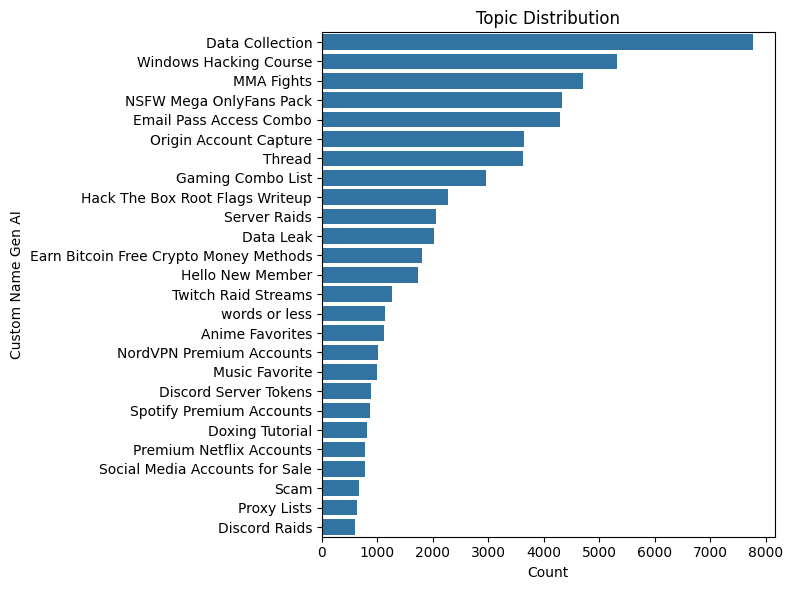

In [20]:
sg.plot_topic_distribution(descr_topic)

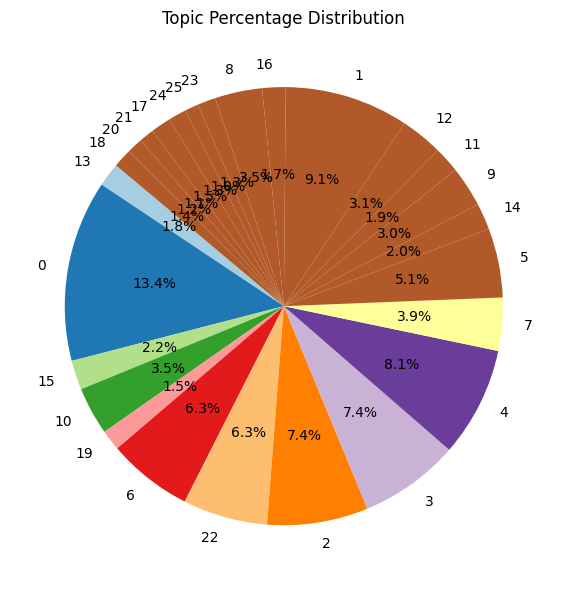

In [21]:
sg.plot_topic_percentage_distribution(descr_topic)

In [ ]:
sg.create_wordclouds(topic_model, num_topics=26, cols=3, width=800, height=600)

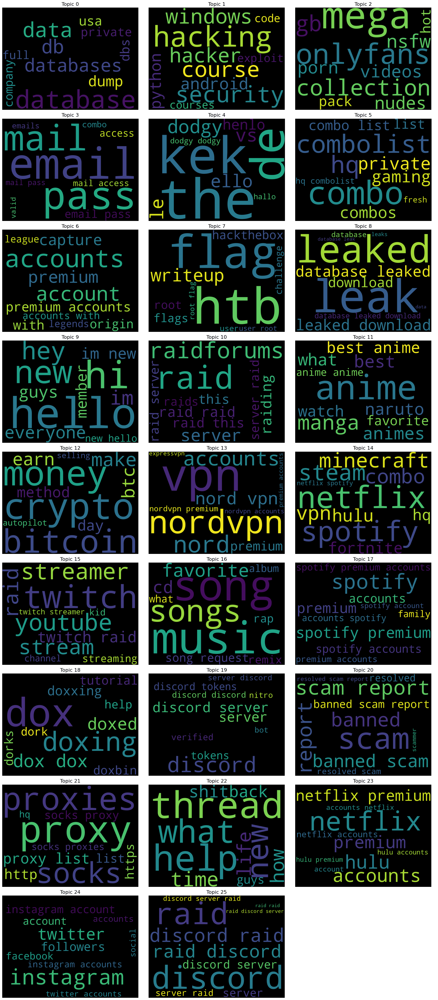

## Document Topic Description

In [25]:
print(document_topic.shape[0])
document_topic.head(5)

58088


,Document,Topic,Probability,Created_on,BERTopic_Name
0,NORDVPN EMAIL PASSWORD,13,[0.00529011 0.00634215 0.00576104 0.00632063 0...,2021-12-16,13_vpn_nordvpn_nord_accounts
1,Multiple private DBs sale,0,[0.15163479 0.02341947 0.01535352 0.03209005 0...,2021-12-16,0_database_data_db_databases
2,Twitch Experiances,15,[2.36766448e-308 3.25020176e-308 4.82940605e-3...,2021-12-16,15_twitch_youtube_streamer_stream
3,Hello Raidforum,10,[0.01228827 0.01569647 0.01971472 0.01083042 0...,2021-12-16,10_raid_raidforums_server_raiding
4,Discord Server Neo Nazi diaper fetish,19,[0.00604313 0.00844743 0.0093405 0.0055302 0...,2021-12-16,19_discord_discord server_server_tokens


In [26]:
result_df = sg.extract_max_probabilities(document_topic)

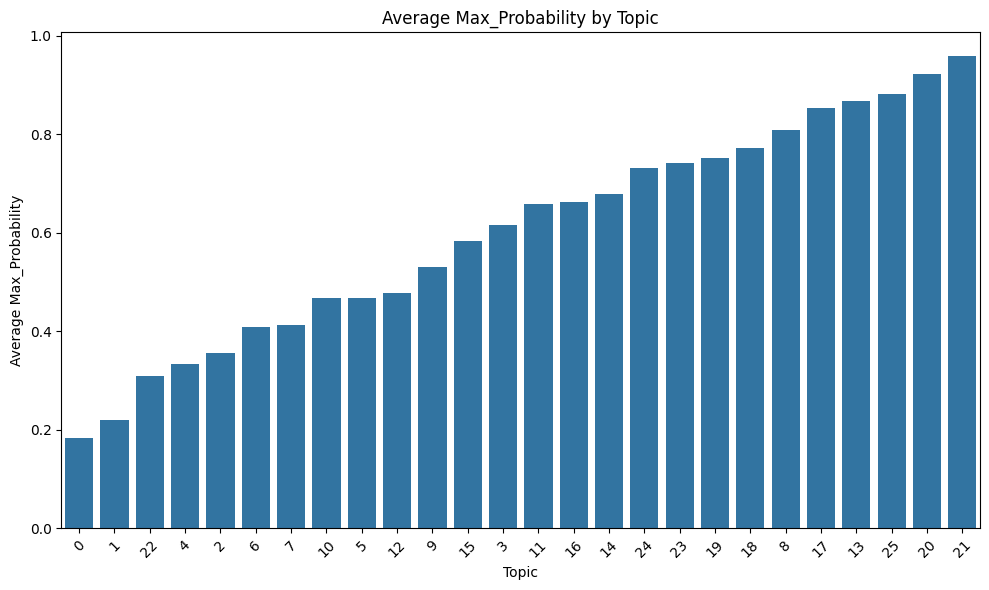

In [27]:
sg.plot_avg_prob_or_freq(result_df, 'Max_Probability', figsize=(10, 6))

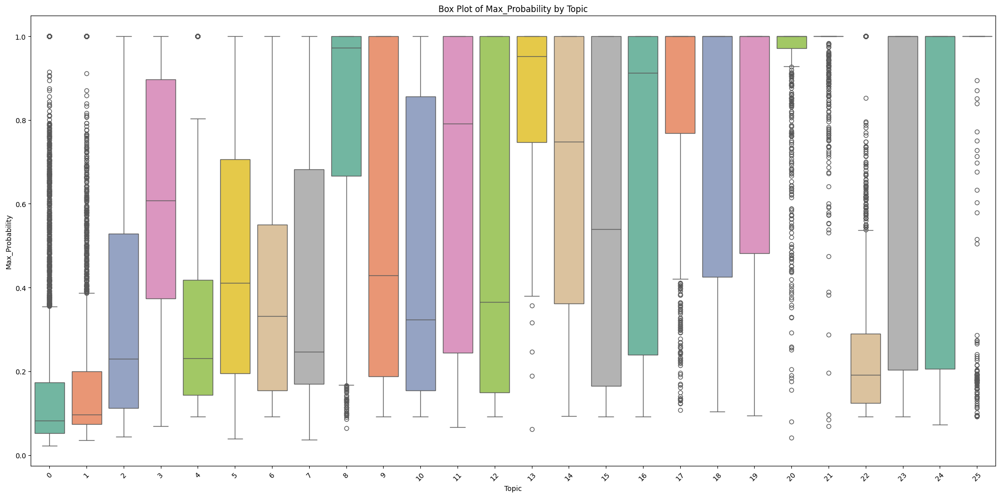

In [28]:
sg.plot_boxplot(result_df, 'Max_Probability', figsize=(20, 10))

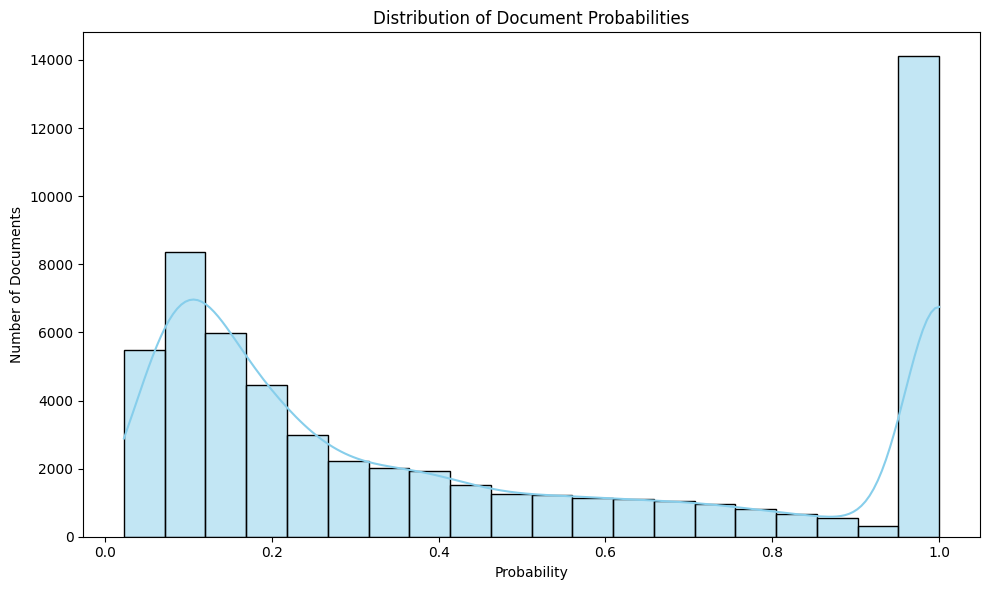

In [29]:
sg.plot_probability_distribution(result_df, 'Max_Probability')

In [ ]:
sg.create_wordclouds(document_topic, num_topics=26, cols=3, is_model=False, width=1000, height=600)

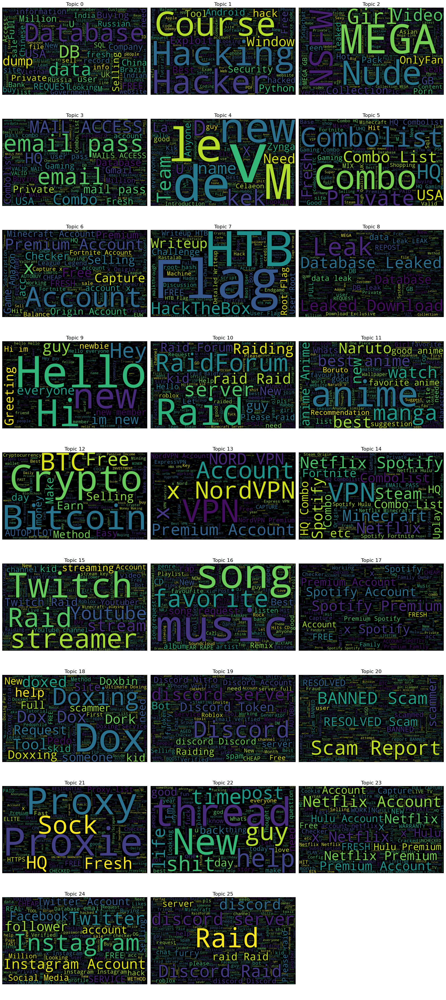

In [ ]:
sg.create_topic_network_graphs(document_topic, max_words=50, min_occurrences=10, cols=2, window_size=10)

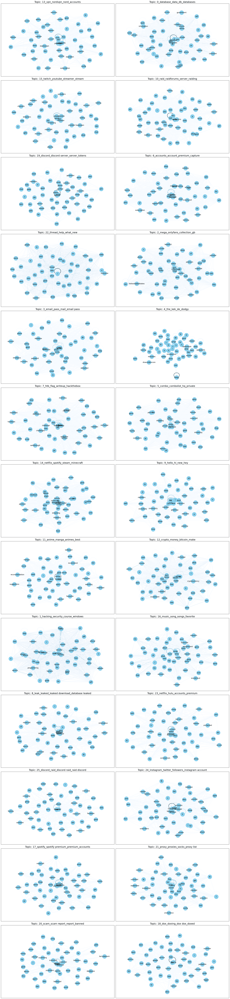

### Sentiment Analysis

In [ ]:
document_topic_sentiment = sg.sentiment_analysis(document_topic, 'Document', 'finiteautomata/bertweet-base-sentiment-analysis')
document_topic_sentiment.drop(columns=['Probability'], inplace=True)
document_topic_sentiment.to_csv('CSV26Topic/document_topic_proba_sentiment.csv', index=False)

In [2]:
document_topic_sentiment = pd.read_csv('CSV26TopicRaid/document_topic_proba_sentiment.csv')
document_topic_sentiment.sort_values('Topic', inplace=True)
document_topic_sentiment.head()

,Document,Topic,Created_on,BERTopic_Name,sentiment,sentiment_probability
44276,things paraguay,0,2021-12-18,0_database_data_db_databases,NEU,0.965513
49177,Is adults READ useful data,0,2021-12-18,0_database_data_db_databases,NEU,0.893569
28606,Us Health Care Provider Database Users,0,2021-12-18,0_database_data_db_databases,NEU,0.971557
28605,I buy MMORPG databases,0,2021-12-18,0_database_data_db_databases,NEU,0.937787
49181,Big Corporation Data Dump,0,2021-12-18,0_database_data_db_databases,NEG,0.691253


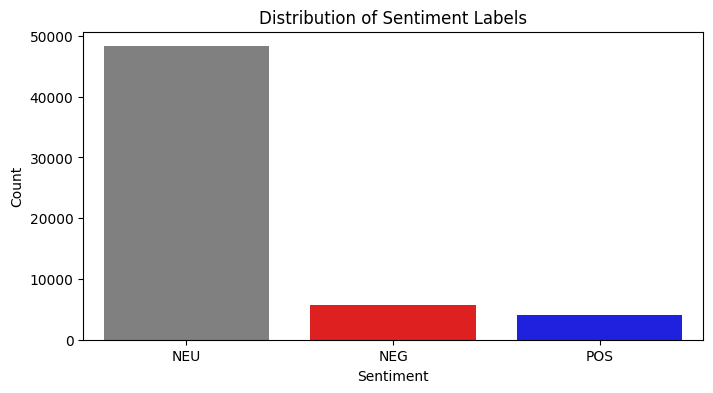

In [9]:
sg.plot_sentiment_distribution(document_topic_sentiment, figsize=(8, 4))

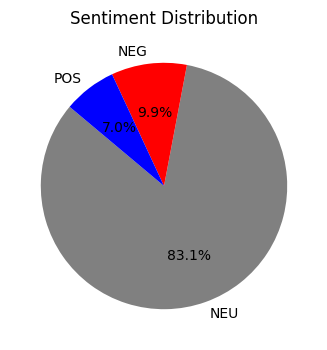

In [10]:
sg.plot_sentiment_distribution(document_topic_sentiment, figsize=(8, 4), chart_type='piechart')

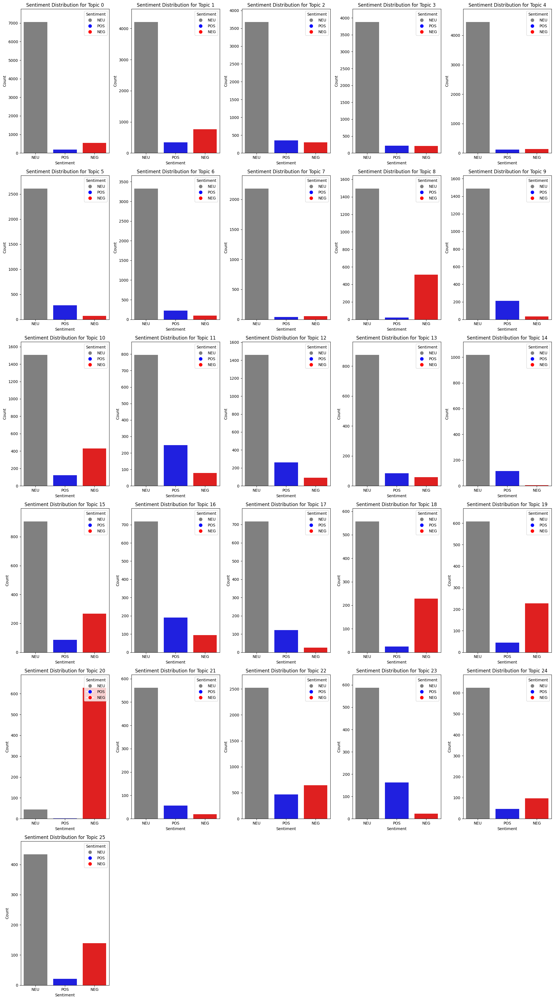

In [11]:
sg.plot_sentiment_distribution_topic(document_topic_sentiment, cols=5, width=20)

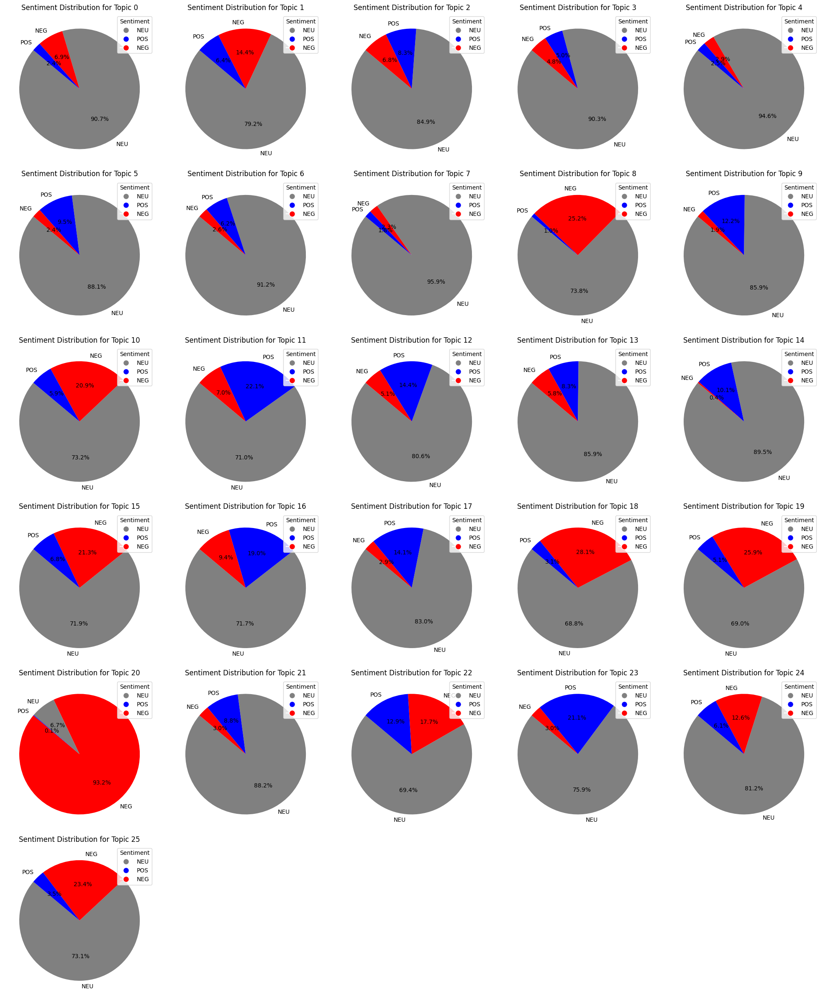

In [12]:
sg.plot_sentiment_distribution_topic(document_topic_sentiment, cols=5, width=20, height=4, chart_type='pie')

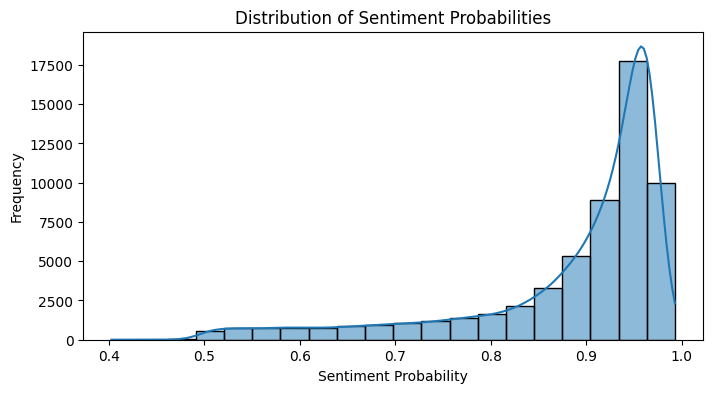

In [13]:
sg.plot_sentiment_probabilities(document_topic_sentiment, figsize=(8, 4))

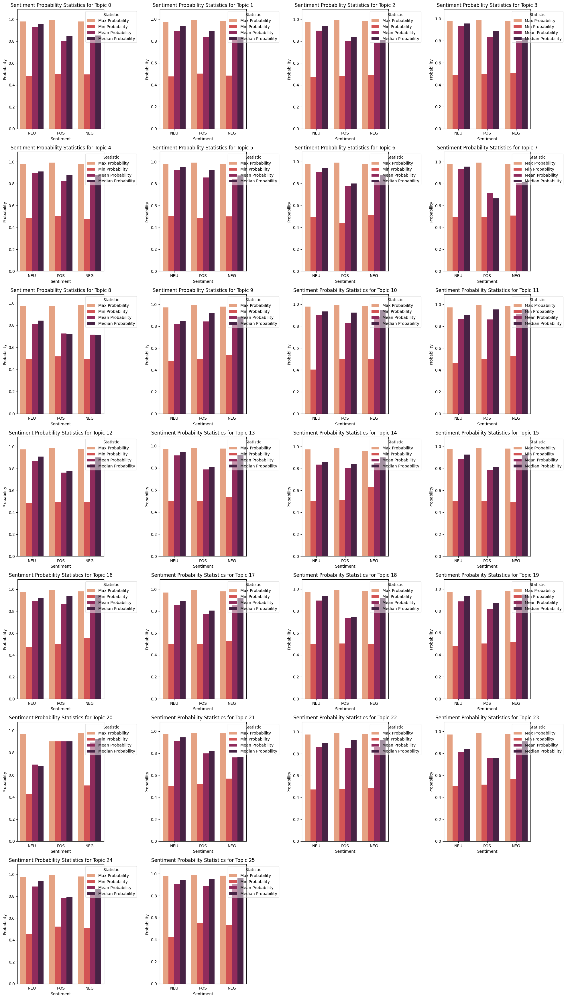

In [3]:
sg.plot_sentiment_statistics_by_topic(sg.calculate_sentiment_statistics(document_topic_sentiment), cols=4, width=20, height=5)

<Figure size 1400x1000 with 0 Axes>

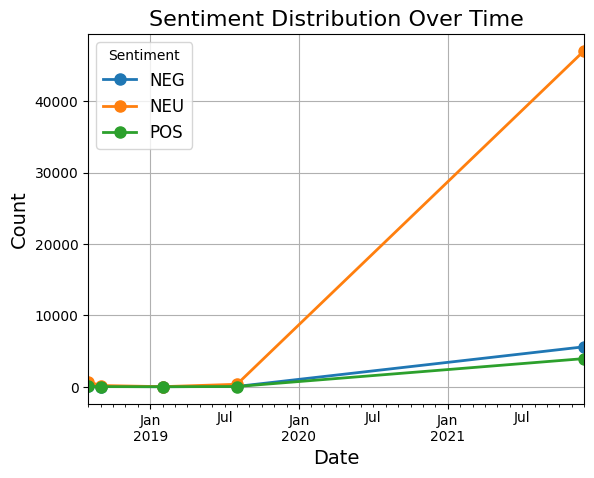

In [15]:
sg.plot_sentiment_over_time(document_topic_sentiment)

## Topics Over Time

In [32]:
print(topics_over_time.shape[0])
topics_over_time.head(5)

52


,Topic,Words,Frequency,Timestamp,Custom_Name_GenAI
0,0,"database, db, data, databases, dump",191,2018-08-19 18:48:57.600,Data Collection
1,0,"database, data, db, databases, dump",7582,2020-11-08 16:00:00.000,Data Collection
2,1,"hacking, programming, exploit, python, android",135,2018-08-19 18:48:57.600,Windows Hacking Course
3,1,"hacking, security, course, windows, hacker",5178,2020-11-08 16:00:00.000,Windows Hacking Course
4,2,"mega, nsfw, onlyfans, gb, porn",103,2018-08-19 18:48:57.600,NSFW Mega OnlyFans Pack


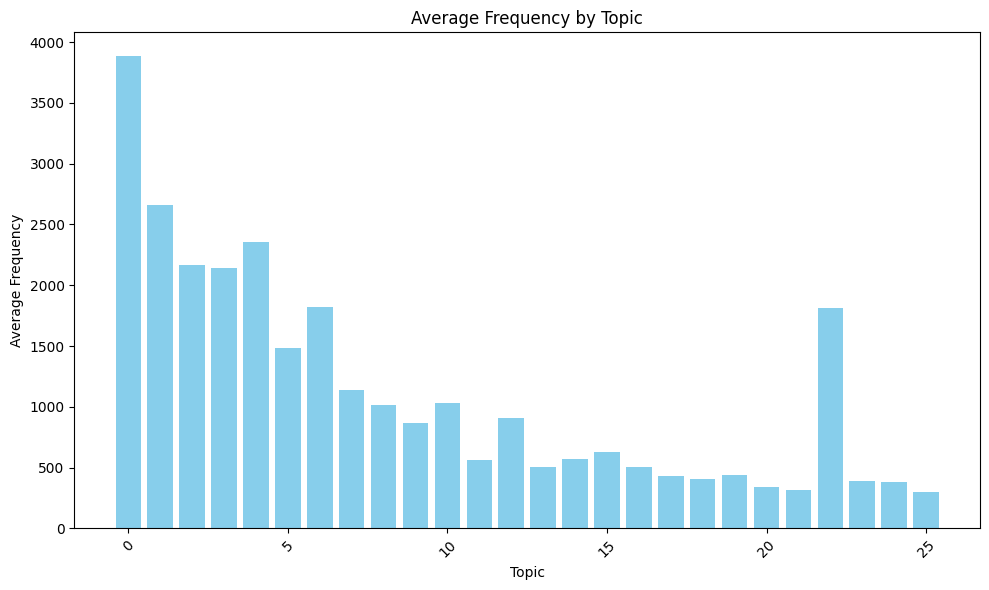

In [33]:
sg.plot_avg_prob_or_freq(topics_over_time, 'Frequency', figsize=(10, 6))

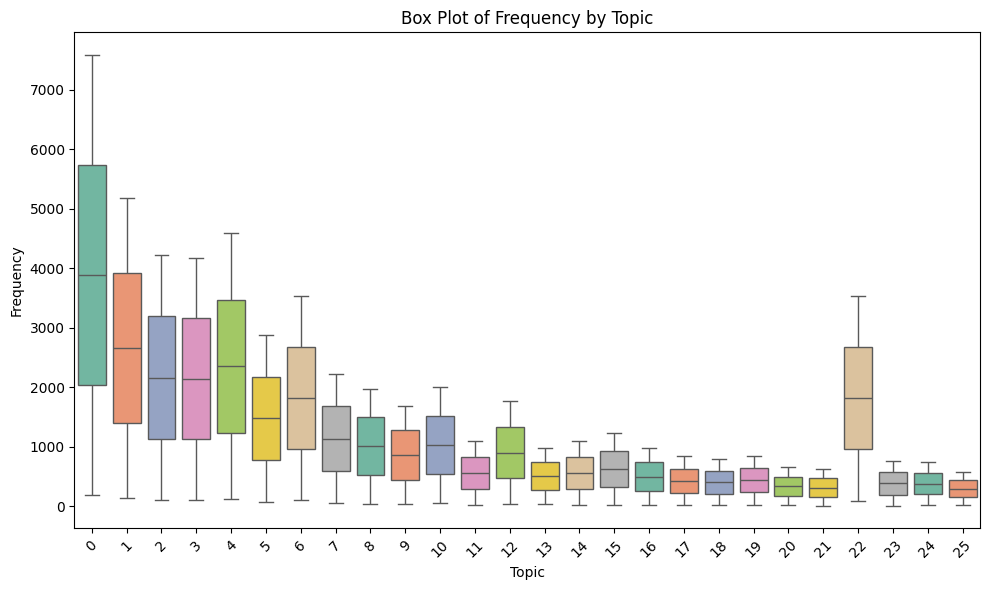

In [34]:
sg.plot_boxplot(topics_over_time, 'Frequency', figsize=(10, 6))

# Visualize Graphs

In [7]:
topic_model = BERTopic.load("../../../Analyze_files/CombiningAnalysisCompleteDataset/ThreadAnalysis/Models/topic_model_all-MiniLM-L6-v2_500_150n_10dim_raid")

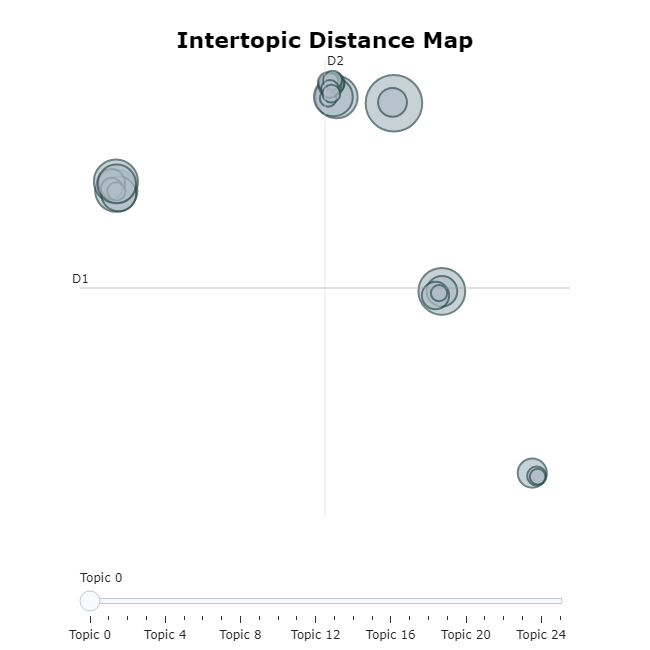

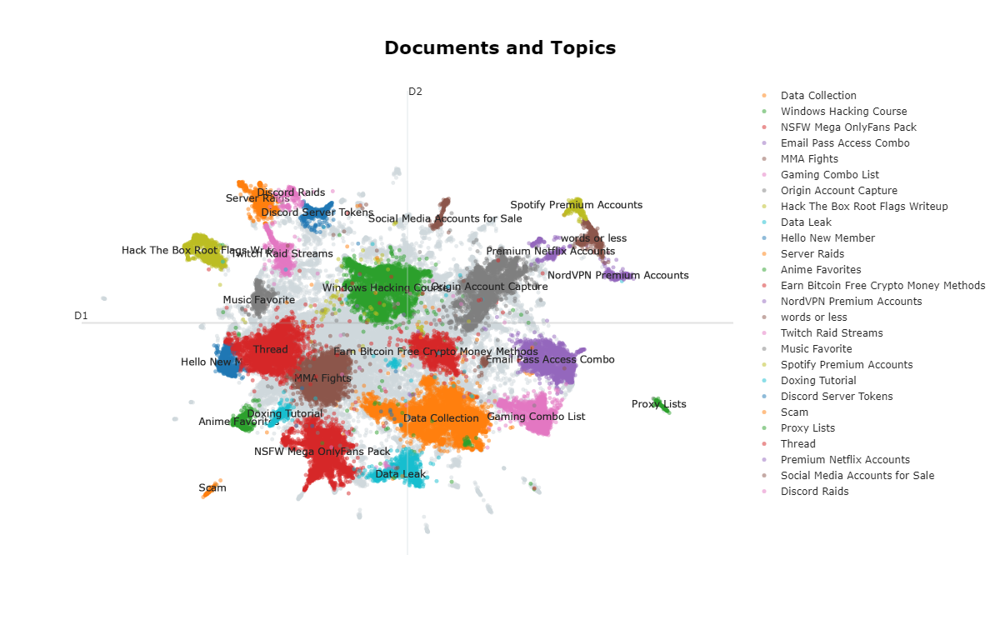

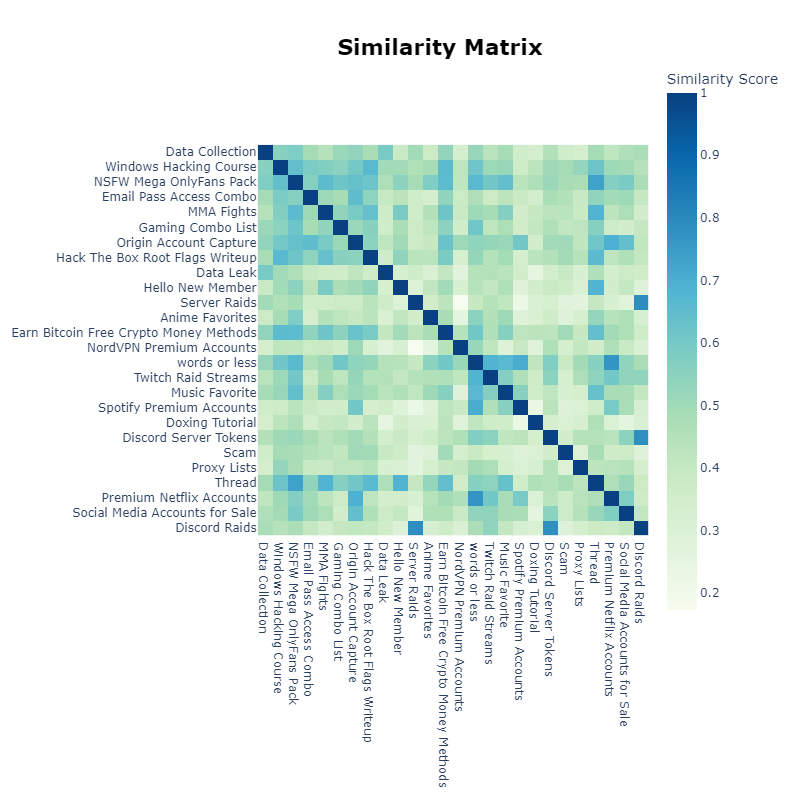
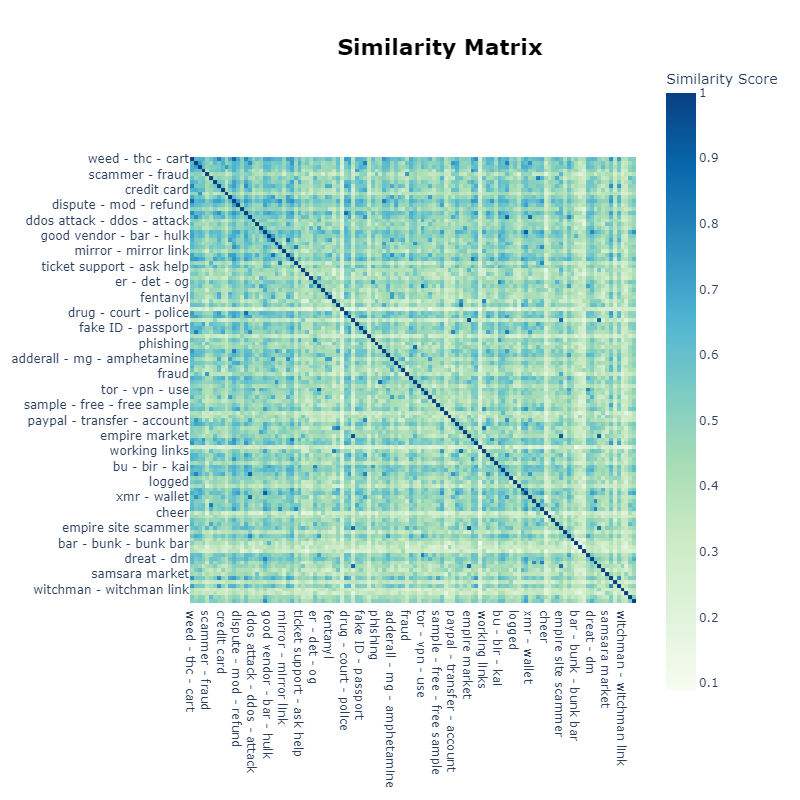
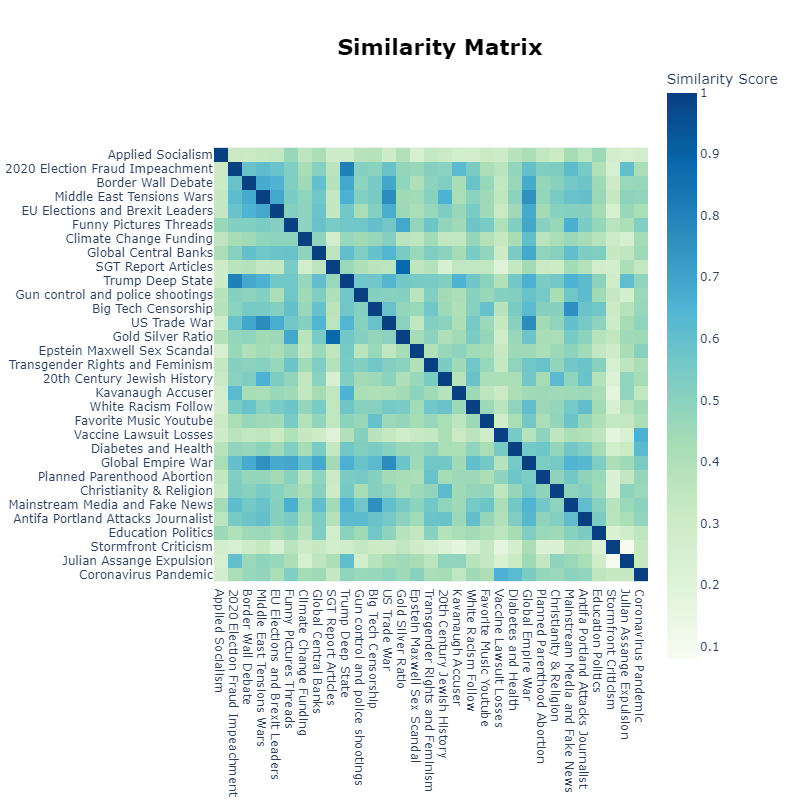

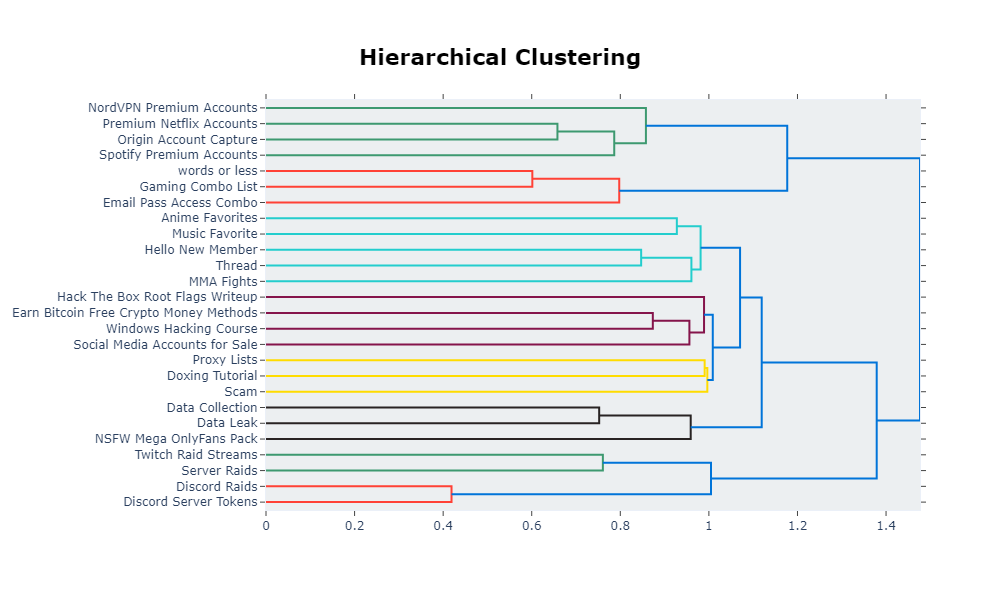
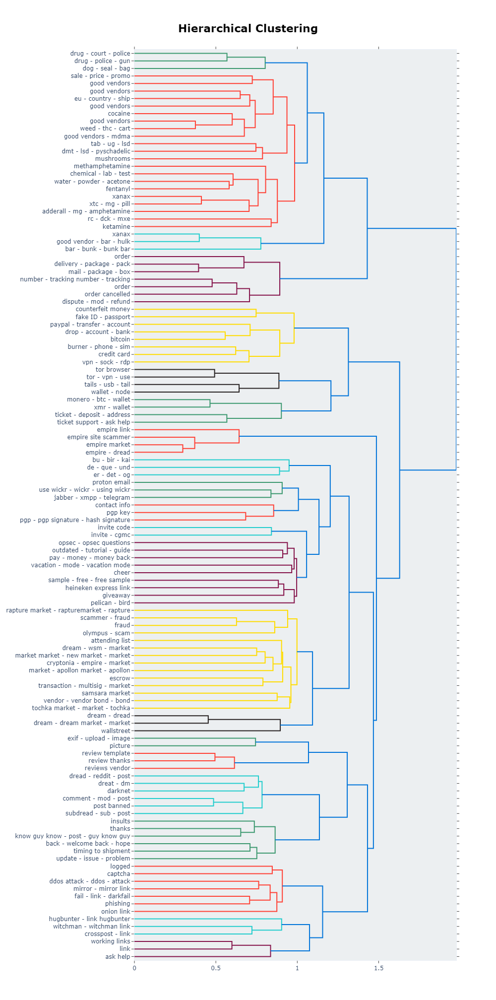
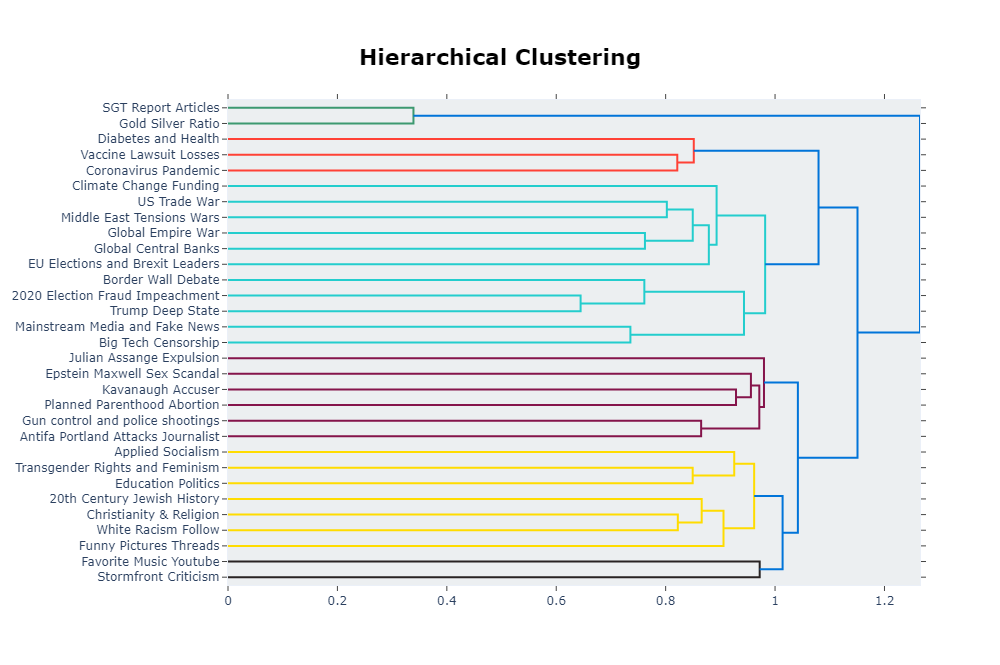

In [35]:
topic_model.visualize_barchart(top_n_topics=27, custom_labels=True, n_words=10, width=350, height=350)

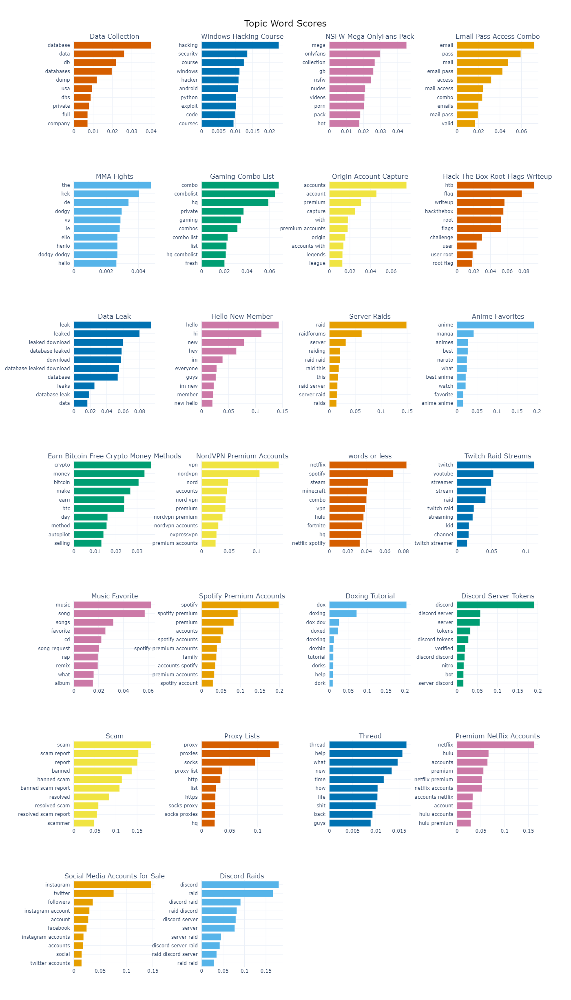
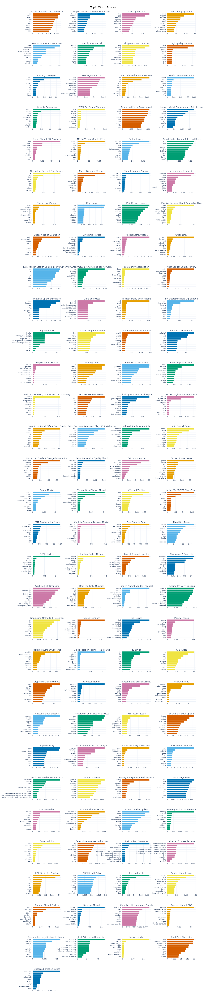
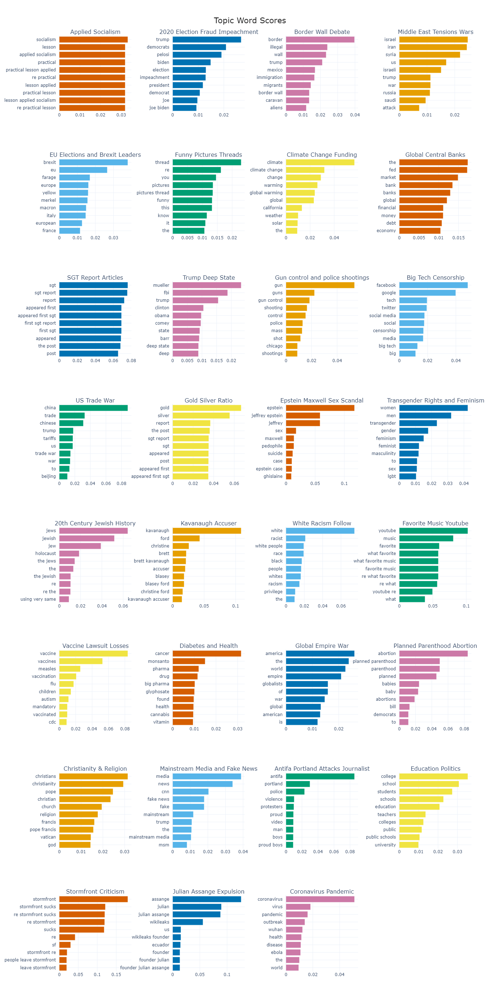

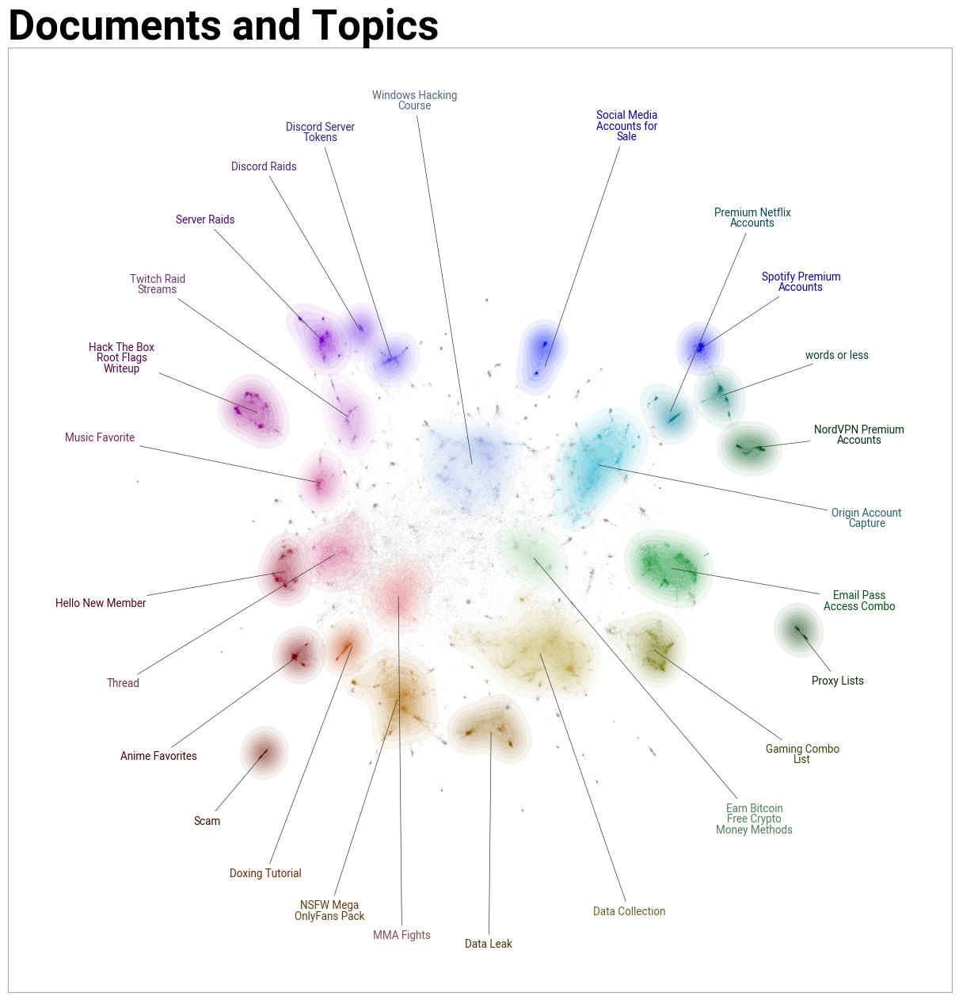
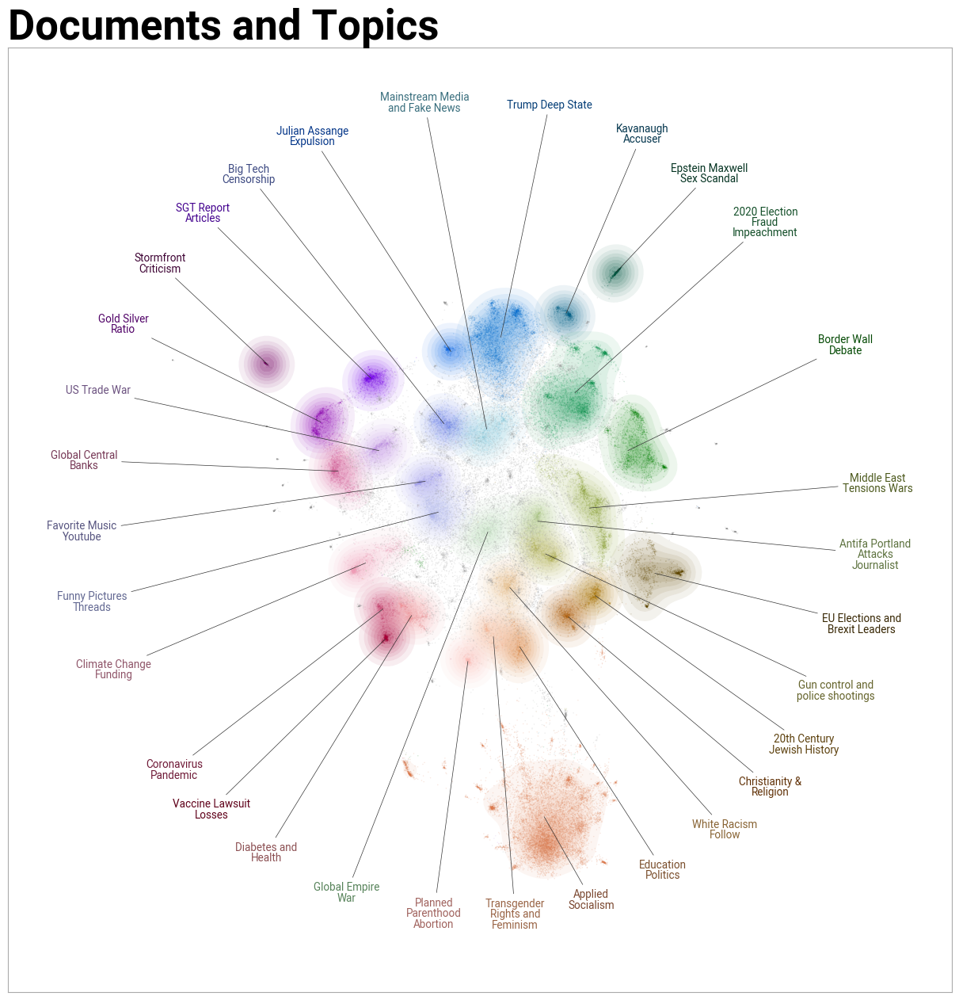

In [36]:
topic_model.visualize_topics_over_time(topics_over_time, top_n_topics=15, width=1250, height=700, custom_labels=True)

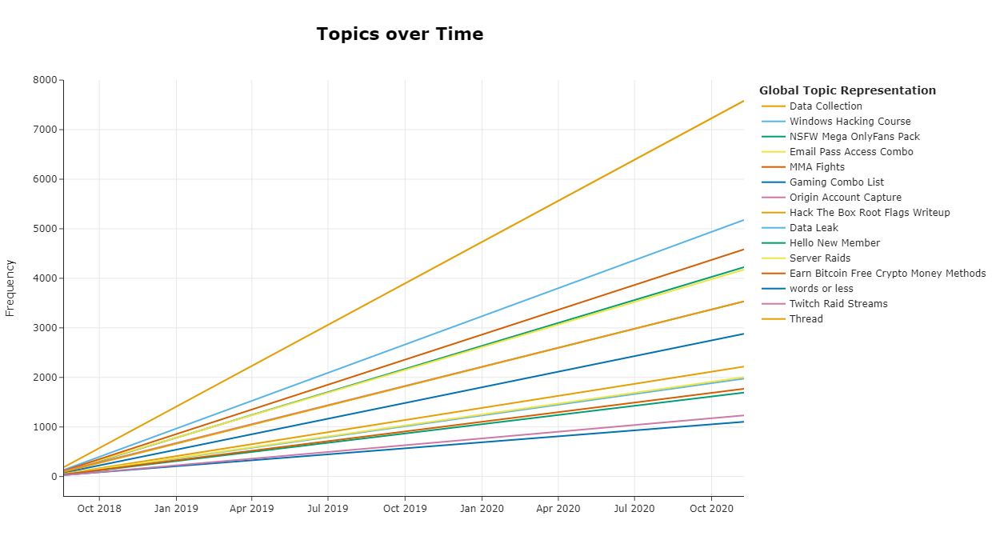
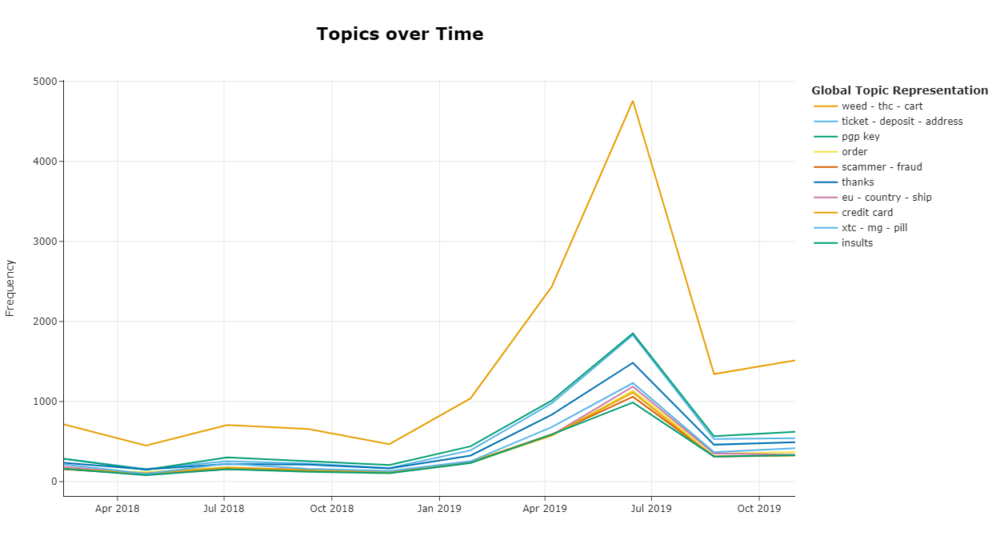
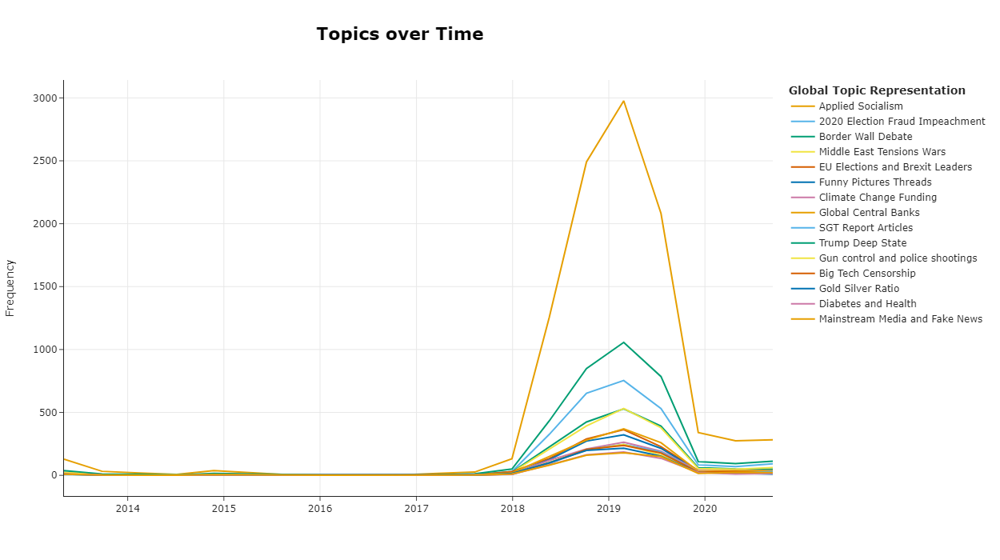
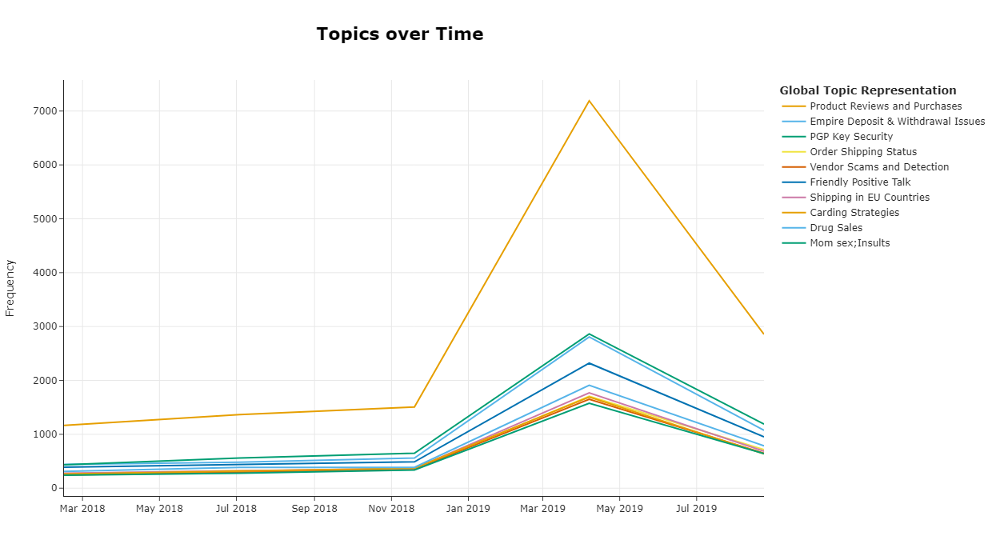
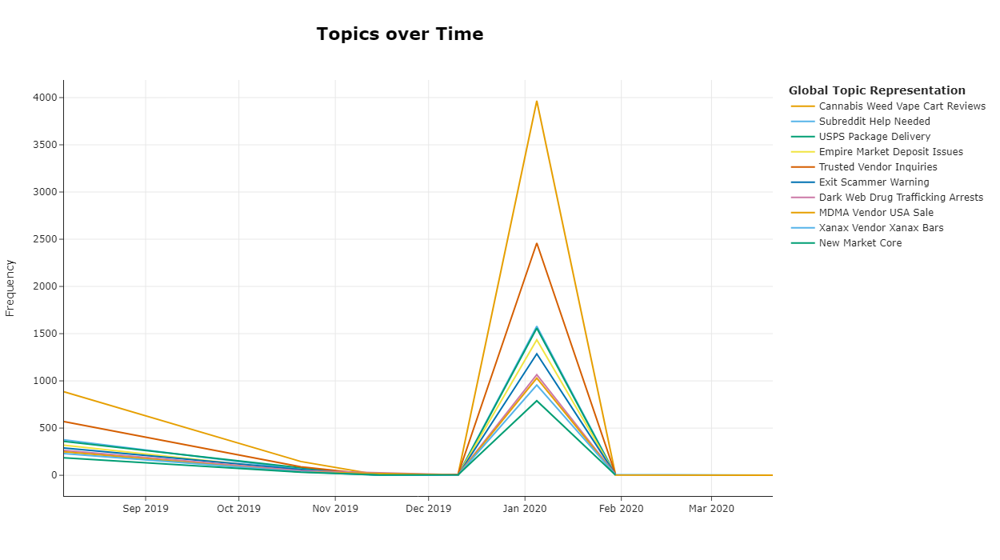

# Predict Models - Usage

In [20]:
topic_model = BERTopic.load("../../../Analyze_files/CombiningAnalysisCompleteDataset/ThreadAnalysis/Models/topic_model_all-MiniLM-L6-v2_500_150n_10dim_raid", embedding_model='all-MiniLM-L6-v2')
topic_model.verbose = False

In [21]:
sentence = ['account']
predict_topic(topic_model, sentence, custom_labels=True)

,Topic,Probability,Label,Words,Sentence
0,"[(accounts, 0.07504779220039917), (account, 0....",1.0,Origin Account Capture,"[accounts, account, premium, capture, with, pr...",account
1,"[(discord, 0.1798355522267642), (raid, 0.16686...",0.0,Discord Raids,"[discord, raid, discord raid, raid discord, di...",account
2,"[(instagram, 0.146686527459099), (twitter, 0.0...",0.0,Social Media Accounts for Sale,"[instagram, twitter, followers, instagram acco...",account
3,"[(hacking, 0.022707734435131164), (security, 0...",0.0,Windows Hacking Course,"[hacking, security, course, windows, hacker, a...",account
4,"[(mega, 0.04520651614339858), (onlyfans, 0.029...",0.0,NSFW Mega OnlyFans Pack,"[mega, onlyfans, collection, gb, nsfw, nudes, ...",account


In [22]:
predict_topic(topic_model, ['social media'], custom_labels=True)

,Topic,Probability,Label,Words,Sentence
0,"[(instagram, 0.146686527459099), (twitter, 0.0...",0.049669,Social Media Accounts for Sale,"[instagram, twitter, followers, instagram acco...",social media
1,"[(hacking, 0.022707734435131164), (security, 0...",0.015226,Windows Hacking Course,"[hacking, security, course, windows, hacker, a...",social media
2,"[(leak, 0.09392037448318262), (leaked, 0.07991...",0.014923,Data Leak,"[leak, leaked, leaked download, database leake...",social media
3,"[(accounts, 0.07504779220039917), (account, 0....",0.014592,Origin Account Capture,"[accounts, account, premium, capture, with, pr...",social media
4,"[(crypto, 0.0366510073149429), (money, 0.03358...",0.014282,Earn Bitcoin Free Crypto Money Methods,"[crypto, money, bitcoin, make, earn, btc, day,...",social media


In [23]:
predict_topic(topic_model, ['games'], custom_labels=True)

,Topic,Probability,Label,Words,Sentence
0,"[(the, 0.004786723468366589), (kek, 0.00404477...",2.240958e-01,MMA Fights,"[the, kek, de, dodgy, vs, le, ello, henlo, dod...",games
1,"[(thread, 0.016598305834427816), (help, 0.0157...",1.973387e-01,Thread,"[thread, help, what, new, time, how, life, shi...",games
2,"[(hello, 0.14336879847201603), (hi, 0.11120275...",1.573819e-01,Hello New Member,"[hello, hi, new, hey, im, everyone, guys, im n...",games
3,"[(anime, 0.19319724189082155), (manga, 0.04163...",5.652742e-11,Anime Favorites,"[anime, manga, animes, best, naruto, what, bes...",games
4,"[(music, 0.06233403710864473), (song, 0.057297...",2.521715e-12,Music Favorite,"[music, song, songs, favorite, cd, song reques...",games


In [24]:
predict_topic(topic_model, ['anime world'], num_classes=3, custom_labels=True)

,Topic,Probability,Label,Words,Sentence
0,"[(anime, 0.19319724189082155), (manga, 0.04163...",1.0,Anime Favorites,"[anime, manga, animes, best, naruto, what, bes...",anime world
1,"[(discord, 0.1798355522267642), (raid, 0.16686...",0.0,Discord Raids,"[discord, raid, discord raid, raid discord, di...",anime world
2,"[(instagram, 0.146686527459099), (twitter, 0.0...",0.0,Social Media Accounts for Sale,"[instagram, twitter, followers, instagram acco...",anime world


In [25]:
predict_topic(topic_model, ['token'], num_classes=1, custom_labels=True)

,Topic,Probability,Label,Words,Sentence
0,"[(discord, 0.19122388011150088), (discord serv...",0.302698,Discord Server Tokens,"[discord, discord server, server, tokens, disc...",token


In [26]:
predict_topic(topic_model, ['only fanser'], num_classes=3, custom_labels=True)

,Topic,Probability,Label,Words,Sentence
0,"[(mega, 0.04520651614339858), (onlyfans, 0.029...",0.064359,NSFW Mega OnlyFans Pack,"[mega, onlyfans, collection, gb, nsfw, nudes, ...",only fanser
1,"[(the, 0.004786723468366589), (kek, 0.00404477...",0.025291,MMA Fights,"[the, kek, de, dodgy, vs, le, ello, henlo, dod...",only fanser
2,"[(anime, 0.19319724189082155), (manga, 0.04163...",0.024674,Anime Favorites,"[anime, manga, animes, best, naruto, what, bes...",only fanser


In [27]:
sentence = ['Porn']
predict_topic(topic_model, sentence, custom_labels=True)

,Topic,Probability,Label,Words,Sentence
0,"[(mega, 0.04520651614339858), (onlyfans, 0.029...",0.079745,NSFW Mega OnlyFans Pack,"[mega, onlyfans, collection, gb, nsfw, nudes, ...",Porn
1,"[(the, 0.004786723468366589), (kek, 0.00404477...",0.026560,MMA Fights,"[the, kek, de, dodgy, vs, le, ello, henlo, dod...",Porn
2,"[(twitch, 0.11194854536356054), (youtube, 0.05...",0.025971,Twitch Raid Streams,"[twitch, youtube, streamer, stream, raid, twit...",Porn
3,"[(music, 0.06233403710864473), (song, 0.057297...",0.025149,Music Favorite,"[music, song, songs, favorite, cd, song reques...",Porn
4,"[(anime, 0.19319724189082155), (manga, 0.04163...",0.024515,Anime Favorites,"[anime, manga, animes, best, naruto, what, bes...",Porn


In [28]:
predict_topic(topic_model, ['data leak'], num_classes=3, custom_labels=True)

,Topic,Probability,Label,Words,Sentence
0,"[(leak, 0.09392037448318262), (leaked, 0.07991...",1.0,Data Leak,"[leak, leaked, leaked download, database leake...",data leak
1,"[(discord, 0.1798355522267642), (raid, 0.16686...",0.0,Discord Raids,"[discord, raid, discord raid, raid discord, di...",data leak
2,"[(instagram, 0.146686527459099), (twitter, 0.0...",0.0,Social Media Accounts for Sale,"[instagram, twitter, followers, instagram acco...",data leak


# Hugging Face

In [ ]:
topic_model.push_to_hf_hub(
    repo_id="D0men1c0/ISSR_Dark_Web_26Topics_Raid",
    save_embedding_model='all-MiniLM-L6-v2',
    save_ctfidf=True
)

In [31]:
topic_model = BERTopic.load('D0men1c0/ISSR_Dark_Web_26Topics_Raid')
logger = MyLogger(level="ERROR")
topic_model.verbose = False

In [32]:
sentence = ['porn']
topic, _ = topic_model.transform(sentence)
topic_model.get_topic_info(topic[0])

,Topic,Count,Name,CustomName,Representation,Representative_Docs
0,2,4326,2_mega_onlyfans_collection_gb,NSFW Mega OnlyFans Pack,"[mega, onlyfans, collection, gb, nsfw, nudes, ...",NaN
